In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df = pd.read_csv('./weatherAUS.csv')

In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [5]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


# Convert date column to datetime

In [6]:
df['Date'] = pd.to_datetime(df['Date'])

# Feature Extraction

In [7]:
df['Month'] = df['Date'].dt.month

In [8]:
df['Year'] = df['Date'].dt.year

In [9]:
def season(x):
    if x in (12, 1, 2):
        return 'Winter'
    elif x in (3, 4, 5):
        return 'Spring'
    elif x in (6, 7, 8):
        return 'Summer'
    else:
        return 'Autumn'

In [10]:
df['Season'] = df['Month'].apply(season)
df['Season'].value_counts()

Spring    38264
Summer    36737
Autumn    35337
Winter    35122
Name: Season, dtype: int64

Does having rain today have an effect on having rain tomorrow?

# Having rain today affect on having rain the next day

In [11]:
Raintomorrow = df.groupby('RainToday')[['RainTomorrow']].count().sort_values(by='RainTomorrow', ascending=False)
Raintomorrow

,RainTomorrow
RainToday,
No,109332
Yes,31455


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


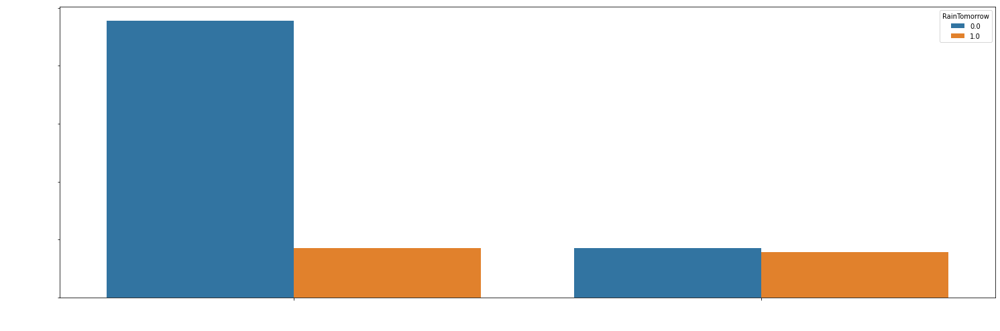

In [117]:
plt.figure(figsize=[25,8])
sns.countplot(df['RainToday'],hue=df['RainTomorrow'])
plt.xlabel('RainToday', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Count', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14)
plt.yticks(color = 'white', fontsize = 14);

### From these graphs we can conclude that the possibility of having rain next day is slightly higher when there is no rain today.

# Minimum Temperature affect on having rain the next day.

In [13]:
MinTemp = df.groupby('MinTemp')[['RainTomorrow']].count().sort_values(by='RainTomorrow', ascending=False).head(150)
MinTemp

,RainTomorrow
MinTemp,
11.0,883
9.6,883
10.2,880
10.5,867
10.8,860
...,...
19.1,500
19.9,497
5.2,495


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


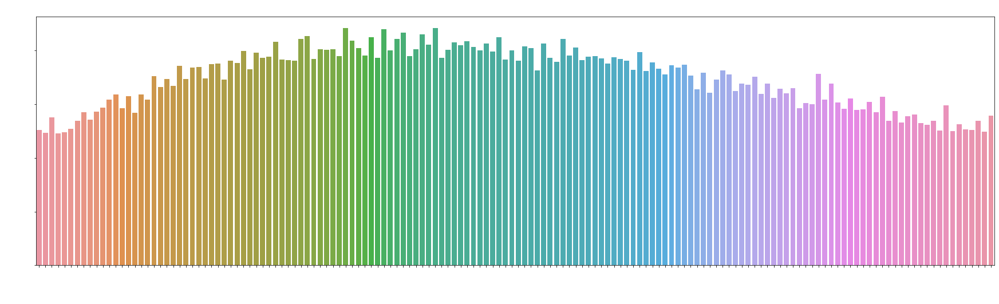

In [14]:
plt.figure(figsize=[30,8])
sns.barplot(MinTemp.index,MinTemp['RainTomorrow'])
plt.title('Minimum Temperature affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Minimum Temperature', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('RainTomorrow', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

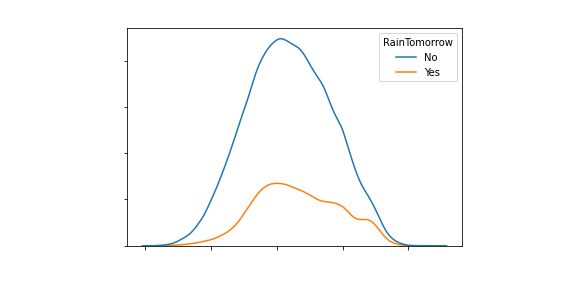

In [15]:
sns.kdeplot(df['MinTemp'],hue = df['RainTomorrow'])
plt.title('Minimum Temperature affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Minimum Temperature', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Density', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14)
plt.yticks(color = 'white', fontsize = 14);

### From these graphs we can conclude that Minimum Temperatures between 8 and 18 have the highest possibilty of having rain the next.

# Maximum Temperature affect on having rain the next day.

In [16]:
MaxTemp = df.groupby('MaxTemp')[['RainTomorrow']].count().sort_values(by='RainTomorrow', ascending=False).head(150)
MaxTemp

,RainTomorrow
MaxTemp,
20.0,871
19.8,829
19.0,827
20.4,820
20.8,804
...,...
14.1,505
14.6,505
27.7,504


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


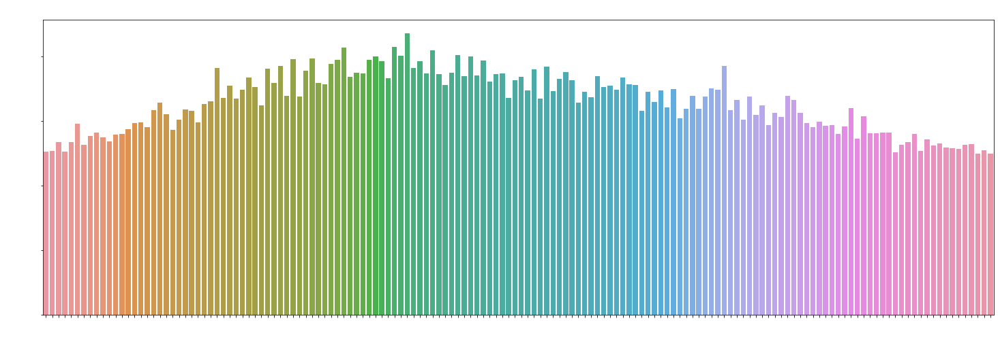

In [17]:
plt.figure(figsize=[25,8])
sns.barplot(MaxTemp.index,MaxTemp['RainTomorrow'])
plt.title('Maximum Temperature affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Maximum Temperature', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('RainTomorrow', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

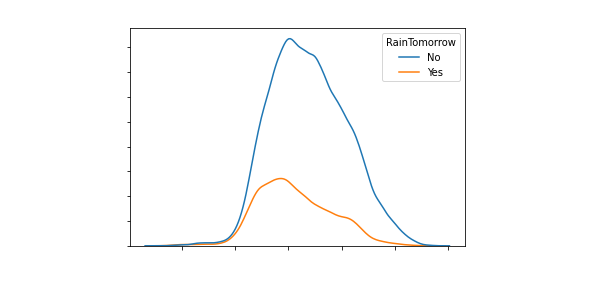

In [18]:
sns.kdeplot(df['MaxTemp'],hue = df['RainTomorrow'])
plt.title('Maximum Temperature affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Maximum Temperature', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Density', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14)
plt.yticks(color = 'white', fontsize = 14);

### From these graphs we can conclude that Maximum Temperatures between 13 and 22 have the highest possibilty of having rain the next.

# Sunshine affect on having rain the next day

In [19]:
Sunshine = df.groupby('Sunshine')[['RainTomorrow']].count().sort_values(by='RainTomorrow', ascending=False).head(150)
Sunshine

,RainTomorrow
Sunshine,
0.0,2308
10.7,1087
11.0,1078
10.8,1058
10.5,1018
...,...
14.0,15
14.1,6
14.3,4


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


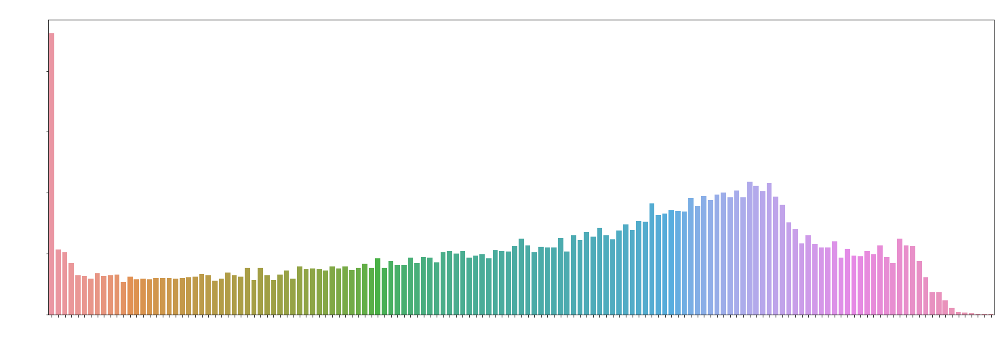

In [20]:
plt.figure(figsize=[25,8])
sns.barplot(Sunshine.index,Sunshine['RainTomorrow'])
plt.title('Sunshine affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Sunshine Temperature', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('RainTomorrow', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

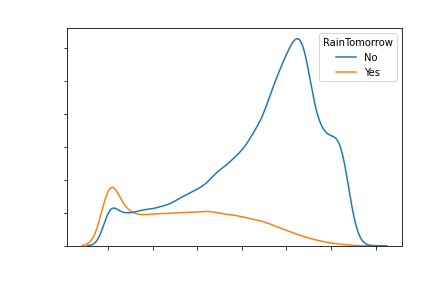

In [21]:
sns.kdeplot(df['Sunshine'],hue = df['RainTomorrow'])
plt.title('Sunshine affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Sunshine', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Density', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14)
plt.yticks(color = 'white', fontsize = 14);

### From these graphs we can conclude that having no Sunshine has a direct affect on having rain the next day

# Wind Gust Speed affect on having rain the next day

In [22]:
WindGustSpeed = df.groupby('WindGustSpeed')[['RainTomorrow']].count().sort_values(by='RainTomorrow', ascending=False).head(150)
WindGustSpeed

,RainTomorrow
WindGustSpeed,
35.0,9070
39.0,8656
31.0,8310
37.0,7903
33.0,7814
...,...
122.0,2
124.0,2
126.0,2


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


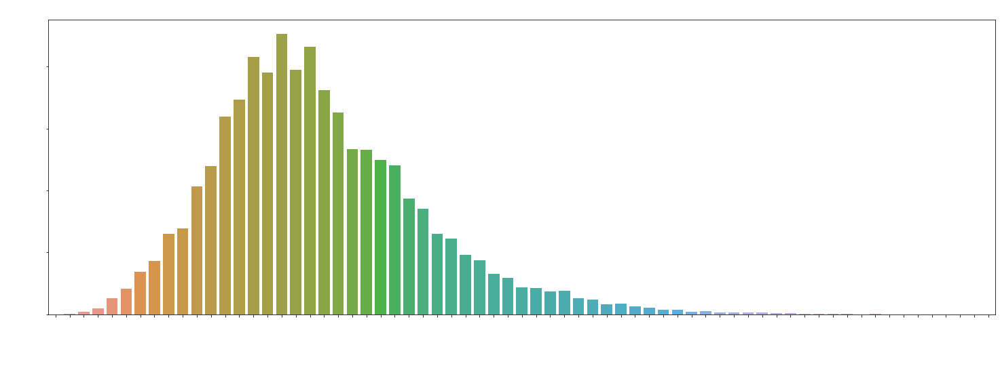

In [23]:
plt.figure(figsize=[25,8])
sns.barplot(WindGustSpeed.index,WindGustSpeed['RainTomorrow'])
plt.title('WindGustSpeed affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('WindGustSpeed', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('RainTomorrow', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

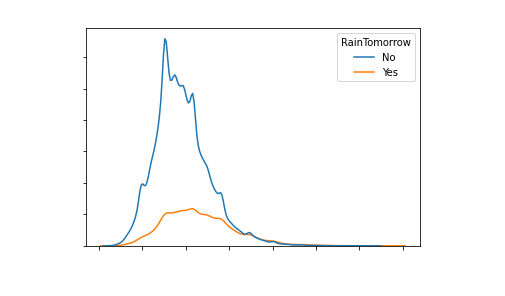

In [24]:
sns.kdeplot(df['WindGustSpeed'],hue = df['RainTomorrow'])
plt.title('WindGustSpeed affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('WindGustSpeed', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Density', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14)
plt.yticks(color = 'white', fontsize = 14);

### From these graphs we can conclude that the possibility of having rain the next day highly increase when the Wind Gust Speed is between 26 and 44 km/h.

# Humidity affect on having rain the next day

In [25]:
df['avgHumidity'] = (df['Humidity3pm'] + df['Humidity9am']) / 2

In [26]:
df['avgHumidity']

0         46.5
1         34.5
2         34.0
3         30.5
4         57.5
          ... 
145455    37.5
145456    38.5
145457    38.5
145458    37.5
145459    49.0
Name: avgHumidity, Length: 145460, dtype: float64

In [27]:
avgHumidity = df.groupby('avgHumidity')[['RainTomorrow']].count().sort_values(by='RainTomorrow', ascending=False).head(150)
avgHumidity

,RainTomorrow
avgHumidity,
62.0,1627
64.0,1612
66.0,1611
63.5,1604
60.5,1574
...,...
95.5,245
23.5,244
96.0,240


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


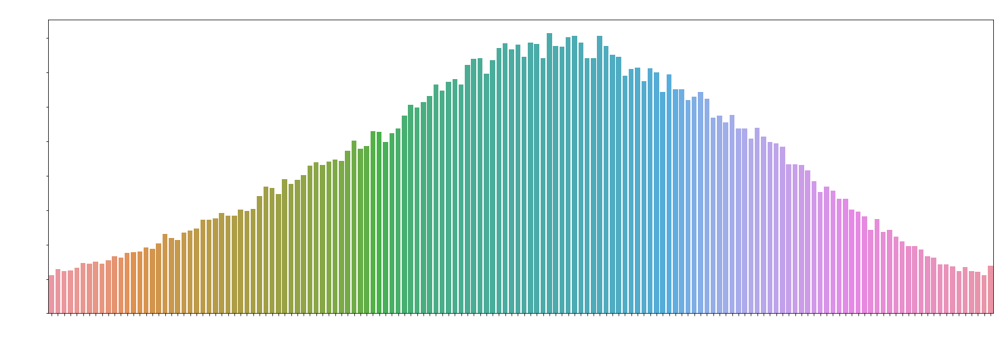

In [28]:
plt.figure(figsize=[25,8])
sns.barplot(avgHumidity.index,avgHumidity['RainTomorrow'])
plt.title('Average Humidity affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Average Humidity', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('RainTomorrow', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

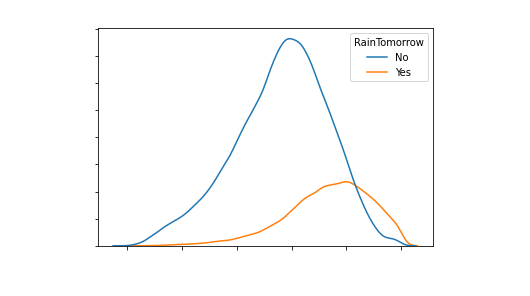

In [29]:
sns.kdeplot(df['avgHumidity'],hue = df['RainTomorrow'])
plt.title('Average Humidity affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Average Humidity', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Density', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14)
plt.yticks(color = 'white', fontsize = 14);

### We can clearly conlude that when the average humidity is higher than 80% it is almost certain that it will rain the next day, the chances are also high when average humitiy reaches 60%.

# Pressure affect on having rain the next day.

In [30]:
df['avgPressure'] = (df['Pressure9am'] + df['Pressure3pm']) / 2

In [31]:
avgPressure = df.groupby('avgPressure')[['RainTomorrow']].count().sort_values(by='RainTomorrow', ascending=False).head(150)
avgPressure

,RainTomorrow
avgPressure,
1017.25,398
1016.25,396
1016.55,393
1016.30,389
1017.50,388
...,...
1022.05,254
1009.45,253
1010.30,249


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


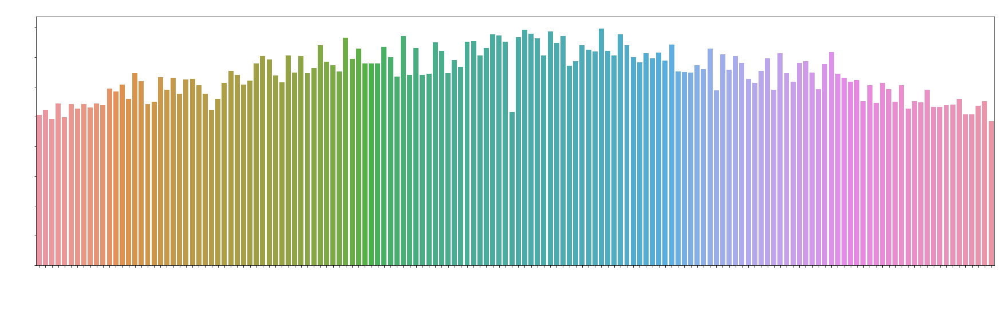

In [32]:
plt.figure(figsize=[30,8])
sns.barplot(avgPressure.index,avgPressure['RainTomorrow'])
plt.title('Average Pressure affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Average Pressure', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('RainTomorrow', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

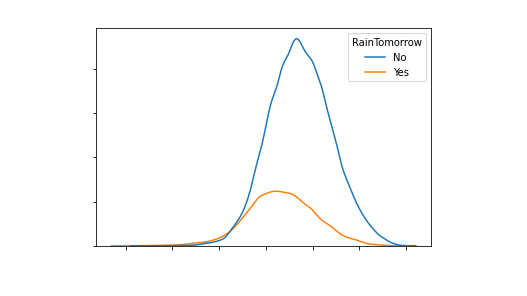

In [33]:
sns.kdeplot(df['avgPressure'],hue = df['RainTomorrow'])
plt.title('Average Pressure affect on rain next Day', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Average Pressure', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Density', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14)
plt.yticks(color = 'white', fontsize = 14);

### There is no real affect that average pressure causes rain the next day but when the pressure is between 1007 and 1015 we have the highest possibilty of having rain the next day

# Rainfall

# Minimum temperature affect on rainfall

In [34]:
MinTemp_rainfall = df.groupby('MinTemp')[['Rainfall']].count().sort_values(by='Rainfall', ascending=False).head(150)
MinTemp_rainfall

,Rainfall
MinTemp,
10.2,882
9.6,880
11.0,875
10.8,865
10.5,862
...,...
19.5,505
5.2,496
19.9,496


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


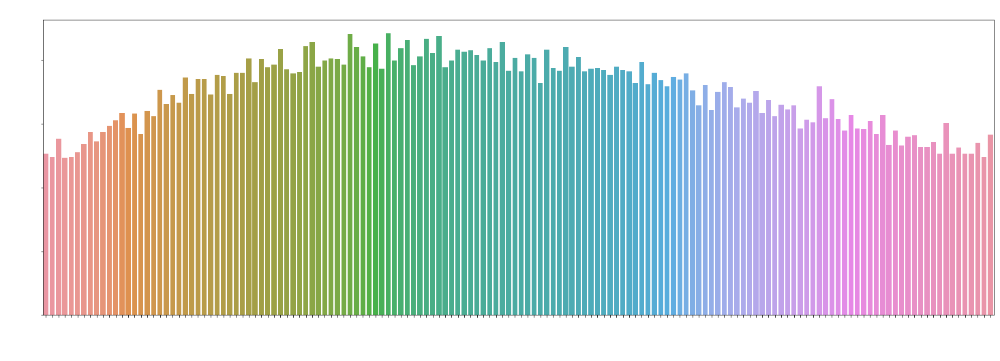

In [35]:
plt.figure(figsize=[25,8])
sns.barplot(MinTemp_rainfall.index,MinTemp_rainfall['Rainfall'])
plt.title('Minimum temperature affect on rainfall', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Minimum temperature', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Rainfall', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

### We can conclude that the rainfall is slightly higher on lower temperatures

# Maximum Temperature affect on rainfall

In [36]:
MaxTemp_rainfall = df.groupby('MaxTemp')[['Rainfall']].count().sort_values(by='Rainfall', ascending=False).head(150)
MaxTemp_rainfall

,Rainfall
MaxTemp,
20.0,864
19.8,825
19.0,823
20.4,819
19.9,811
...,...
29.3,507
14.6,505
30.0,502


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


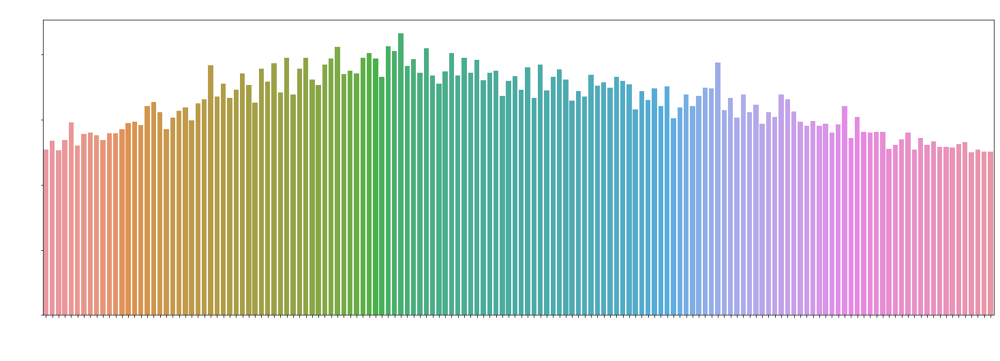

In [37]:
plt.figure(figsize=[25,8])
sns.barplot(MaxTemp_rainfall.index,MaxTemp_rainfall['Rainfall'])
plt.title('Maximum temperature affect on rainfall', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Maximum temperature', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Rainfall', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

### We can conclude that the rainfall is slightly lower on higher temperatures

# Sunshine affect on rainfall

In [38]:
Sunshine_rainfall = df.groupby('Sunshine')[['Rainfall']].count().sort_values(by='Rainfall', ascending=False).head(150)
Sunshine_rainfall

,Rainfall
Sunshine,
0.0,2313
10.7,1089
11.0,1082
10.8,1061
10.5,1017
...,...
14.0,15
14.1,6
14.3,4


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


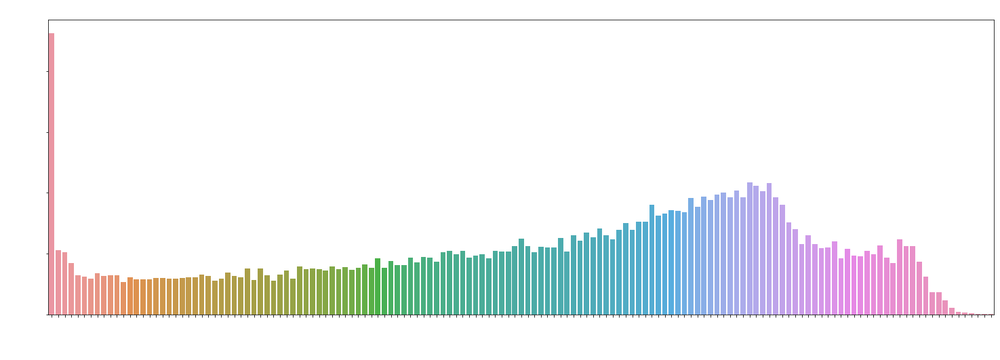

In [39]:
plt.figure(figsize=[25,8])
sns.barplot(Sunshine_rainfall.index,Sunshine_rainfall['Rainfall'])
plt.title('Sunshine affect on rainfall', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Sunshine', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Rainfall', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

### We can conclide that Sunshine has a direct affect on Rainfall.

# Wind Gust Speect affect on rainfall

In [40]:
WindGustSpeed_rainfall = df.groupby('WindGustSpeed')[['Rainfall']].count().sort_values(by='Rainfall', ascending=False).head(150)
WindGustSpeed_rainfall

,Rainfall
WindGustSpeed,
35.0,9042
39.0,8627
31.0,8270
37.0,7893
33.0,7773
...,...
126.0,2
135.0,2
122.0,2


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


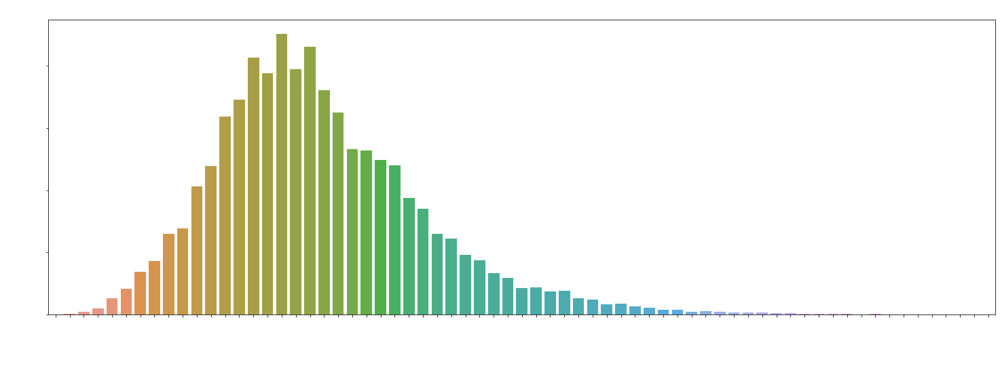

In [41]:
plt.figure(figsize=[25,8])
sns.barplot(WindGustSpeed_rainfall.index,WindGustSpeed_rainfall['Rainfall'])
plt.title('WindGustSpeed affect on Rainfall', color= 'white', size= 22, weight = 'bold')
plt.xlabel('WindGustSpeed', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Rainfall', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

### We can conclude that when the Wind Gust Speed is between 24 and 54 km/h we have the highest amounts of rainfall.

# Humidity affect on windfall

In [42]:
avgHumidity_rainfall = df.groupby('avgHumidity')[['Rainfall']].count().sort_values(by='Rainfall', ascending=False).head(150)
avgHumidity_rainfall

,Rainfall
avgHumidity,
62.0,1628
64.0,1610
66.0,1607
63.5,1605
60.5,1578
...,...
94.5,246
95.5,246
96.0,241


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


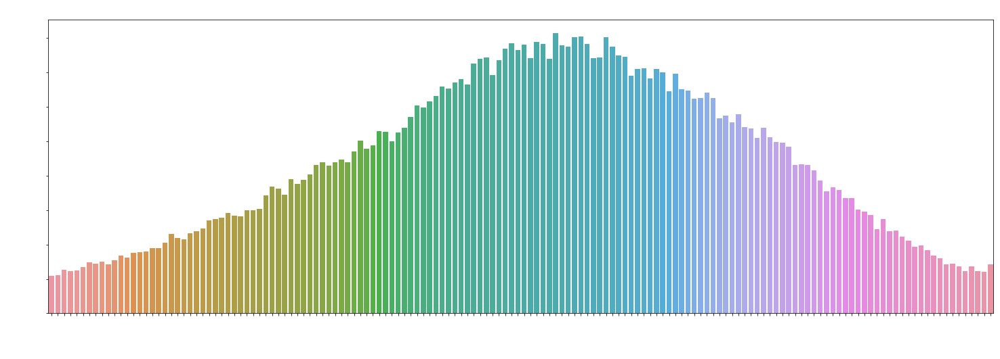

In [43]:
plt.figure(figsize=[25,8])
sns.barplot(avgHumidity_rainfall.index,avgHumidity_rainfall['Rainfall'])
plt.title('Average Humidity affect on Rainfall', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Average Humidity', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Rainfall', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

### we can conclude that when the average humidity is between 42 and 80 % we have the highest amounts of rainfall

# Pressure affect on rainfall

In [44]:
avgPressure_rainfall = df.groupby('avgPressure')[['Rainfall']].count().sort_values(by='Rainfall', ascending=False).head(150)
avgHumidity_rainfall

,Rainfall
avgHumidity,
62.0,1628
64.0,1610
66.0,1607
63.5,1605
60.5,1578
...,...
94.5,246
95.5,246
96.0,241


c:\Users\hmagdy.ITECHS-EG\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


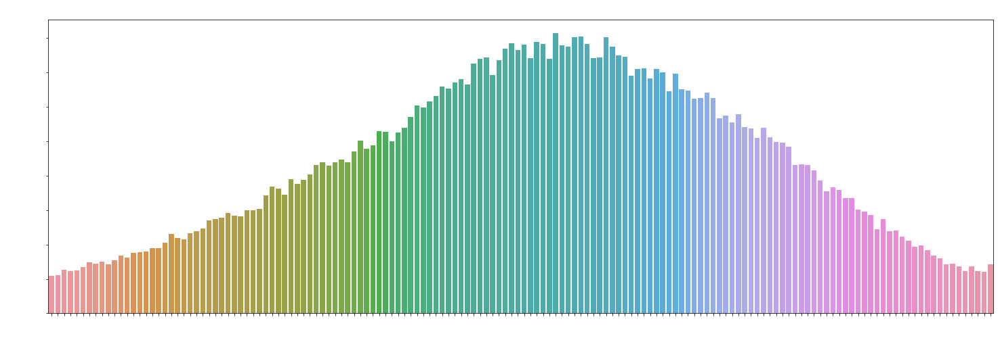

In [45]:
plt.figure(figsize=[25,8])
sns.barplot(avgHumidity_rainfall.index,avgHumidity_rainfall['Rainfall'])
plt.title('Average Pressure affect on Rainfall', color= 'white', size= 22, weight = 'bold')
plt.xlabel('Average Pressure', color= 'white', fontsize = 18, weight = 'bold')
plt.ylabel('Rainfall', color= 'white', fontsize = 18, weight = 'bold')
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

### we can conclude that when the average pressure is between 50 and 75  we have the highest amounts of rainfall

# Correlation

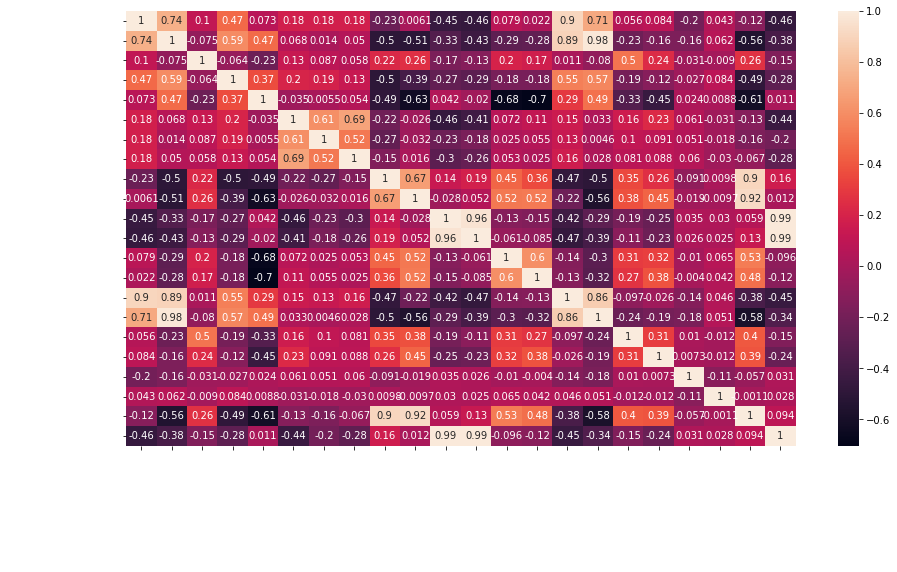

In [51]:
plt.figure(figsize=[15,8])
sns.heatmap(df.corr(),annot = True)
plt.xticks(color = 'white', fontsize = 14, rotation = 90)
plt.yticks(color = 'white', fontsize = 14);

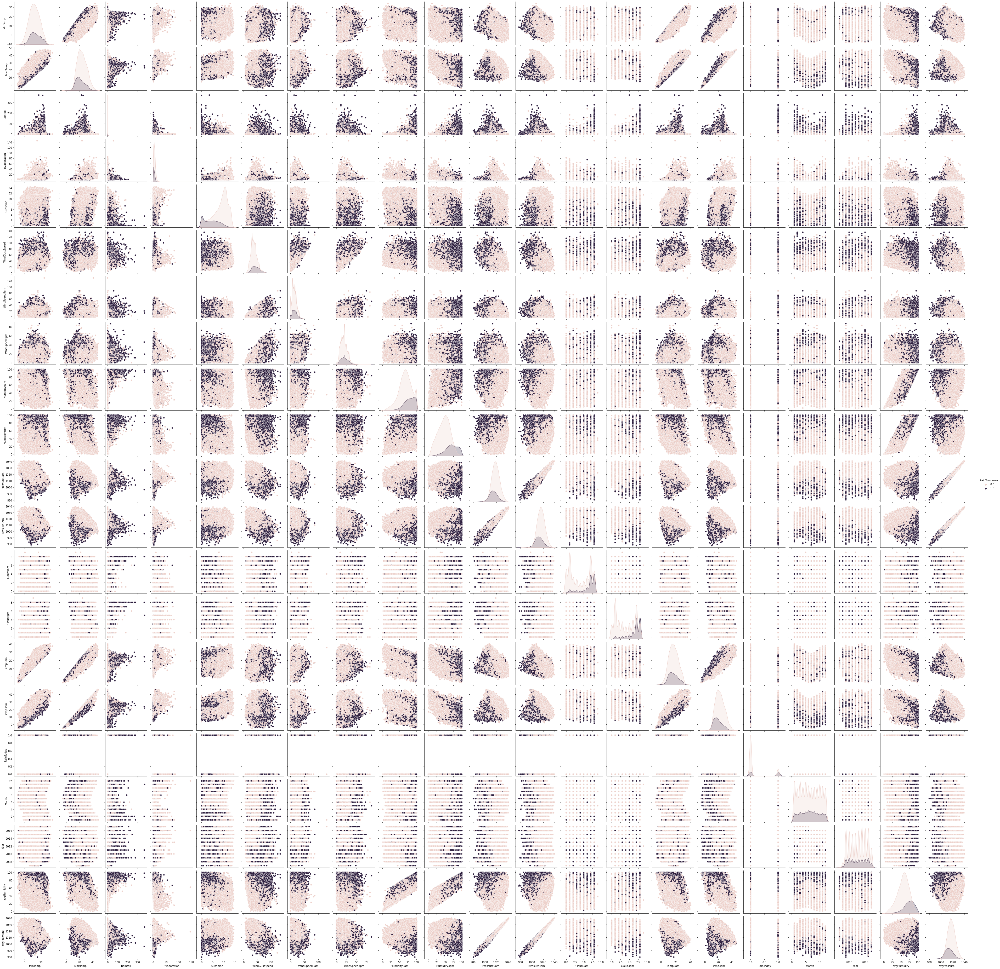

In [68]:
sns.pairplot(data=df ,hue ='RainTomorrow')

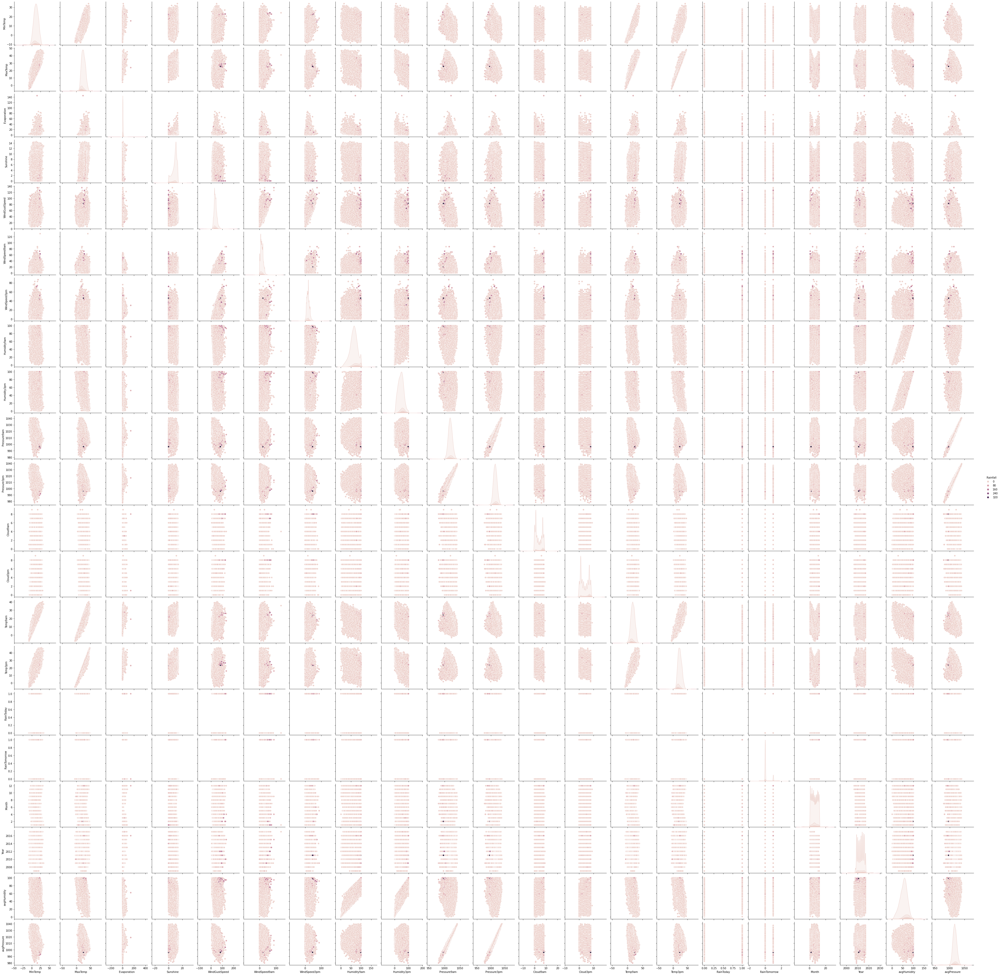

In [69]:
sns.pairplot(data=df ,hue ='Rainfall')

# Detect Missing Values

In [46]:
df.isna().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
Month                0
Year                 0
Season               0
avgHumidity       5274
avgPressure      15289
dtype: int64

## Handling Missing Values

In [52]:
sunshine_na_percentage = df['Sunshine'].isna().sum()/len(df['Sunshine'])
sunshine_na_percentage

0.48009762133919975

In [53]:
from sklearn.impute import SimpleImputer

In [54]:
df['MinTemp'] = SimpleImputer(strategy='median').fit_transform(df[['MinTemp']])

In [55]:
df['MaxTemp'] = SimpleImputer(strategy='median').fit_transform(df[['MaxTemp']])

In [56]:
df['Rainfall'] = SimpleImputer(strategy='median').fit_transform(df[['Rainfall']])

In [57]:
df.drop(columns=['Evaporation', 'Sunshine'], inplace= True)

In [58]:
df['WindGustDir'] = df['WindGustDir'].fillna(method = 'ffill')

In [59]:
df['WindGustSpeed'] = SimpleImputer(strategy='median').fit_transform(df[['WindGustSpeed']])

In [60]:
df['WindDir9am'] = df['WindDir9am'].fillna(method = 'ffill')

In [61]:
df['WindDir3pm'].value_counts()

SE     10838
W      10110
S       9926
WSW     9518
SSE     9399
SW      9354
N       8890
WNW     8874
NW      8610
ESE     8505
E       8472
NE      8263
SSW     8156
NNW     7870
ENE     7857
NNE     6590
Name: WindDir3pm, dtype: int64

In [62]:
df['WindDir3pm'] = df['WindDir3pm'].fillna(method = 'ffill')

In [63]:
df['WindSpeed9am'] = SimpleImputer(strategy='median').fit_transform(df[['WindSpeed9am']])

In [64]:
df['WindSpeed3pm'] = SimpleImputer(strategy='median').fit_transform(df[['WindSpeed3pm']])

In [65]:
df['Humidity9am'] = SimpleImputer(strategy='median').fit_transform(df[['Humidity9am']])

In [66]:
df['Humidity3pm'] = SimpleImputer(strategy='mean').fit_transform(df[['Humidity3pm']])

In [67]:
df['Pressure9am'] = SimpleImputer(strategy='median').fit_transform(df[['Pressure9am']])

In [68]:
df['Pressure3pm'] = SimpleImputer(strategy='median').fit_transform(df[['Pressure3pm']])

In [69]:
df.drop(columns=['Cloud9am', 'Cloud3pm'], inplace= True)

In [70]:
df['Temp9am'] = SimpleImputer(strategy='median').fit_transform(df[['Temp9am']])

In [71]:
df['Temp3pm'] = SimpleImputer(strategy='median').fit_transform(df[['Temp3pm']])

In [72]:
df['RainToday'] = df['RainToday'].fillna(method = 'ffill')

In [74]:
df['RainTomorrow'] = df['RainTomorrow'].fillna(method = 'ffill')

In [75]:
df['avgHumidity'] = SimpleImputer(strategy='median').fit_transform(df[['avgHumidity']])

In [76]:
df['avgPressure'] = SimpleImputer(strategy='median').fit_transform(df[['avgPressure']])

In [77]:
df.isna().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Month            0
Year             0
Season           0
avgHumidity      0
avgPressure      0
dtype: int64

# Handling Categorical Data

In [47]:
encoded = {'Yes':1 ,
           'No' :0 ,
            }

In [48]:
df['RainToday'] = df['RainToday'].map(encoded)

In [49]:
df['RainTomorrow'] = df['RainTomorrow'].map(encoded)

In [50]:
from sklearn.preprocessing import OneHotEncoder
onehot = OneHotEncoder(drop='first')
df_new = onehot.fit_transform(df[['WindGustDir','WindDir9am', 'WindDir3pm', 'Location', 'Season']])

In [78]:
df_new.toarray()

array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       ...,
       [0., 0., 1., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.]])

In [79]:
df_encoded = pd.DataFrame(df_new.toarray(),columns =onehot.get_feature_names_out())

In [80]:
df_encoded

,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,...,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,Season_Spring,Season_Summer,Season_Winter
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145456,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145457,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145458,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [81]:
df_final = pd.concat([df,df_encoded],axis=1)

In [82]:
df_final.drop(columns=['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'Date', 'Season'], inplace= True)

In [83]:
df_final

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,Season_Spring,Season_Summer,Season_Winter
0,13.4,22.9,0.6,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,7.4,25.1,0.0,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,12.9,25.7,0.0,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,9.2,28.0,0.0,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2.8,23.4,0.0,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145456,3.6,25.3,0.0,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145457,5.4,26.9,0.0,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145458,7.8,27.0,0.0,28.0,13.0,7.0,51.0,24.0,1019.4,1016.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


# Detect Outliers

<AxesSubplot:>

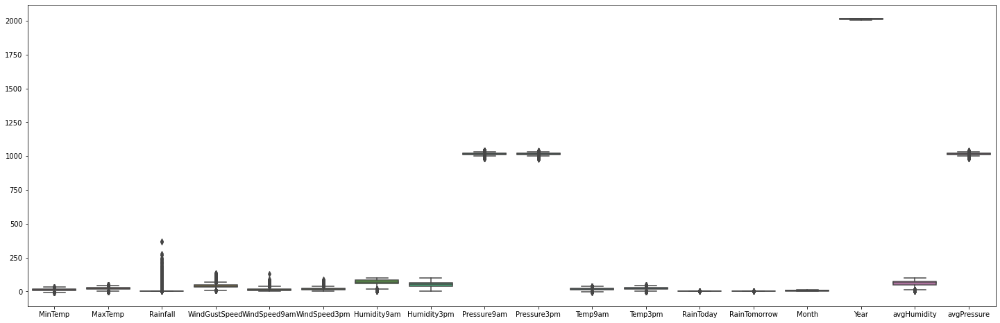

In [84]:
plt.figure(figsize=[25,8])
sns.boxplot(data=df)

<AxesSubplot:>

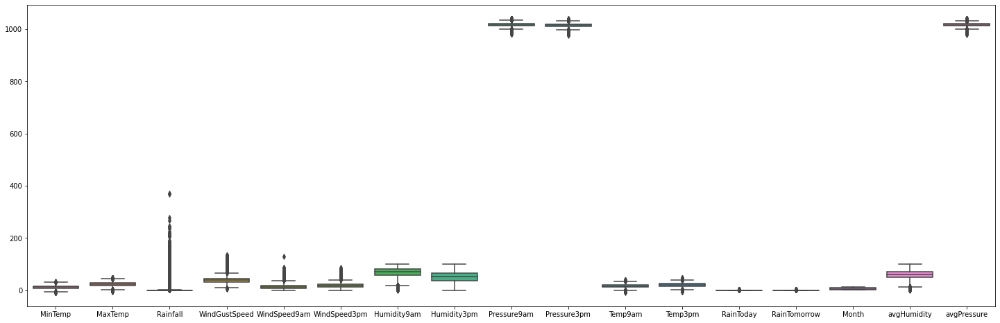

In [85]:
plt.figure(figsize=[25,8])
sns.boxplot(data=df.drop(columns=['Year']))

In [86]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'WindGustDir',
       'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow',
       'Month', 'Year', 'Season', 'avgHumidity', 'avgPressure'],
      dtype='object')

In [87]:
from datasist.structdata import detect_outliers
index = detect_outliers(df,0, ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'avgHumidity', 'avgPressure'])
len(index)

37640

## Handling Outliers

In [88]:
for i in df[['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'avgHumidity', 'avgPressure']]:
    detect_outlier_index = detect_outliers(df,0,[i])
    median = df[i].median()
    df[i].iloc[detect_outlier_index] = median

C:\Users\hmagdy.ITECHS-EG\AppData\Local\Temp\ipykernel_14124\3734744294.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].iloc[detect_outlier_index] = median
C:\Users\hmagdy.ITECHS-EG\AppData\Local\Temp\ipykernel_14124\3734744294.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[i].iloc[detect_outlier_index] = median
C:\Users\hmagdy.ITECHS-EG\AppData\Local\Temp\ipykernel_14124\3734744294.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view

<AxesSubplot:>

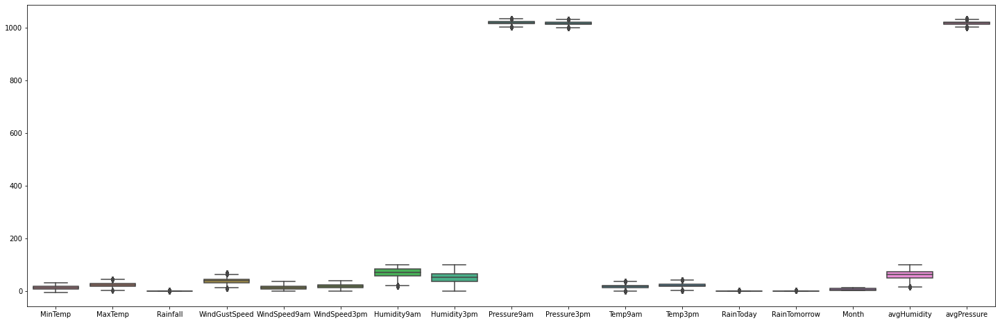

In [89]:
plt.figure(figsize=[25,8])
sns.boxplot(data=df.drop(columns=['Year']))

# split input data and output data

## RainTomorrow

In [90]:
X = df_final.drop('RainTomorrow',axis = 1)
y = df_final['RainTomorrow']

In [91]:
X

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,Season_Spring,Season_Summer,Season_Winter
0,13.4,22.9,0.6,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,7.4,25.1,0.0,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,12.9,25.7,0.0,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,9.2,28.0,0.0,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2.8,23.4,0.0,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145456,3.6,25.3,0.0,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145457,5.4,26.9,0.0,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145458,7.8,27.0,0.0,28.0,13.0,7.0,51.0,24.0,1019.4,1016.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [92]:
from sklearn.model_selection import train_test_split

In [93]:
x_train, x_test, y_train, y_test = train_test_split(X,y,test_size = 0.2,random_state=0,stratify=y)

In [94]:
x_train

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,Season_Spring,Season_Summer,Season_Winter
109065,14.8,19.3,1.6,39.0,6.0,19.0,84.0,77.0,1019.4,1018.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
41940,13.3,21.4,1.8,35.0,11.0,24.0,45.0,47.0,1024.9,1022.4,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
37454,1.6,17.9,0.0,19.0,13.0,9.0,82.0,44.0,1026.9,1023.7,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
110805,16.8,19.8,29.4,39.0,33.0,39.0,91.0,82.0,1010.2,1010.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
106986,22.1,29.8,0.0,63.0,41.0,35.0,61.0,21.0,1012.2,1011.7,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74276,-0.6,15.7,0.0,35.0,7.0,15.0,100.0,46.0,1024.7,1020.4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
79661,9.5,19.7,0.0,31.0,6.0,6.0,97.0,65.0,1015.7,1013.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
135339,0.8,14.2,0.4,20.0,0.0,9.0,98.0,66.0,1017.6,1015.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
29120,0.7,20.0,0.0,30.0,0.0,13.0,86.0,33.0,1032.2,1029.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [95]:
y_train.value_counts()

0.0    90161
1.0    26207
Name: RainTomorrow, dtype: int64

In [96]:
y_test.value_counts()

0.0    22540
1.0     6552
Name: RainTomorrow, dtype: int64

# Handling Imbalance Data

### SMOTE

In [97]:
from imblearn.over_sampling import SMOTE

smote = SMOTE()
x_train_smote , y_train_smote = smote.fit_resample(x_train,y_train)

In [98]:
x_train_smote

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,Season_Spring,Season_Summer,Season_Winter
0,14.800000,19.300000,1.600000,39.000000,6.000000,19.000000,84.000000,77.000000,1019.400000,1018.500000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,0.000000
1,13.300000,21.400000,1.800000,35.000000,11.000000,24.000000,45.000000,47.000000,1024.900000,1022.400000,...,0.0,0.000000,0.0,1.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
2,1.600000,17.900000,0.000000,19.000000,13.000000,9.000000,82.000000,44.000000,1026.900000,1023.700000,...,1.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000
3,16.800000,19.800000,29.400000,39.000000,33.000000,39.000000,91.000000,82.000000,1010.200000,1010.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,0.000000
4,22.100000,29.800000,0.000000,63.000000,41.000000,35.000000,61.000000,21.000000,1012.200000,1011.700000,...,0.0,0.000000,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180317,6.383877,13.855470,0.096353,35.000000,12.036468,14.927063,82.445297,73.000000,1017.600000,1015.200000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.518234,0.481766,0.000000
180318,16.688382,28.069696,0.000000,57.717173,6.489896,9.565655,64.207068,68.489896,1006.539900,1002.919194,...,0.0,0.641414,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,1.000000
180319,17.395704,25.415384,8.713287,62.756244,7.000000,13.243756,100.000000,93.103896,1012.345155,1008.832268,...,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
180320,17.710385,22.830237,8.855740,43.848817,9.000000,19.453550,92.453550,81.941717,1005.697633,1003.961569,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.151183


In [99]:
y_train_smote.value_counts()

1.0    90161
0.0    90161
Name: RainTomorrow, dtype: int64

In [100]:
x_train_smote.duplicated().sum()

291

## Feature Scaling using standard scaler

In [101]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [102]:
x_train_scaled = pd.DataFrame(x_train_scaled,columns = scaler.get_feature_names_out())

In [103]:
x_train_scaled

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,Season_Spring,Season_Summer,Season_Winter
0,0.409595,-0.552877,-0.083628,-0.073304,-0.906214,0.038969,0.801051,1.244170,0.258775,0.485781,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,1.673919,-0.580301,-0.563880
1,0.173740,-0.256450,-0.059644,-0.378329,-0.341758,0.612898,-1.268516,-0.221817,1.077874,1.071481,...,-0.145516,-0.144899,-0.146254,6.911669,-0.145393,-0.145978,-0.145146,-0.597400,-0.580301,-0.563880
2,-1.665934,-0.750494,-0.275498,-1.598427,-0.115976,-1.108889,0.694919,-0.368416,1.375728,1.266714,...,6.872077,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,1.723245,-0.563880
3,0.724069,-0.482299,3.250118,-0.073304,2.141845,2.334685,1.172511,1.488501,-1.111355,-0.790743,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,1.673919,-0.580301,-0.563880
4,1.557426,0.929257,-0.275498,1.756843,3.044974,1.875542,-0.419463,-1.492339,-0.813501,-0.535438,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,6.889592,-0.597400,-0.580301,1.773428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116363,-2.011855,-1.061037,-0.275498,-0.378329,-0.793322,-0.420174,1.650104,-0.270683,1.048089,0.771122,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,1.723245,-0.563880
116364,-0.423761,-0.496414,-0.275498,-0.683353,-0.906214,-1.453246,1.490906,0.657775,-0.292256,-0.310169,...,-0.145516,-0.144899,6.837435,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,-0.580301,-0.563880
116365,-1.791723,-1.272770,-0.227531,-1.522171,-1.583560,-1.108889,1.543972,0.706641,-0.009294,-0.009811,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,1.723245,-0.563880
116366,-1.807447,-0.454068,-0.275498,-0.759609,-1.583560,-0.649746,0.907182,-0.905944,2.165042,2.107718,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,1.723245,-0.563880


In [104]:
x_test_scaled = pd.DataFrame(x_test_scaled,columns = scaler.get_feature_names_out())

In [105]:
x_test_scaled

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,Season_Spring,Season_Summer,Season_Winter
0,0.409595,-0.425837,0.108242,0.079208,-0.115976,-0.420174,0.907182,0.902106,-0.515646,-0.505403,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,1.673919,-0.580301,-0.563880
1,-1.634486,-1.272770,-0.275498,-0.912122,-0.906214,-0.649746,0.801051,1.048705,-0.098650,-0.535438,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,-0.580301,-0.563880
2,0.409595,-0.623454,-0.275498,-0.073304,-1.131996,-2.141961,-0.525595,0.413444,-0.009294,-0.009811,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,-0.580301,-0.563880
3,-0.832577,-0.199988,-0.275498,-0.073304,-0.906214,-1.453246,-0.684792,-0.563881,0.914054,0.741086,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,1.723245,-0.563880
4,-0.879749,-1.329232,0.731821,0.918026,1.351608,1.301613,0.747985,0.266845,-0.336934,-0.054864,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,1.673919,-0.580301,-0.563880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29087,-0.832577,-1.286886,-0.251514,0.231721,0.561370,1.072041,-0.154134,-0.172951,-4.283503,-3.343793,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,1.723245,-0.563880
29088,0.189463,-0.312912,-0.203547,1.604331,0.674261,3.367757,0.429590,-0.661613,-1.170926,-1.181210,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,-0.580301,1.773428
29089,-0.219353,-0.256450,-0.227531,0.460489,1.125826,1.072041,-0.684792,-1.052543,0.363024,0.290548,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,6.889592,1.673919,-0.580301,-0.563880
29090,1.290123,0.519906,-0.275498,-1.064634,-1.131996,-0.649746,0.005064,0.413444,-0.351826,-0.159990,...,-0.145516,-0.144899,-0.146254,-0.144683,-0.145393,-0.145978,-0.145146,-0.597400,-0.580301,1.773428


# split input data and output data

## RainFall

In [106]:
X_fall = df_final.drop('Rainfall',axis = 1)
y_fall = df_final['Rainfall']

In [107]:
X_fall

,MinTemp,MaxTemp,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,...,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,Season_Spring,Season_Summer,Season_Winter
0,13.4,22.9,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,7.4,25.1,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,12.9,25.7,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,9.2,28.0,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,17.5,32.3,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2.8,23.4,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,10.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145456,3.6,25.3,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,10.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145457,5.4,26.9,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,12.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145458,7.8,27.0,28.0,13.0,7.0,51.0,24.0,1019.4,1016.5,15.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [108]:
x_train_fall, x_test_fall, y_train_fall, y_test_fall = train_test_split(X,y,test_size = 0.2,random_state=10)

In [109]:
y_train_fall.value_counts()

0.0    90119
1.0    26249
Name: RainTomorrow, dtype: int64

In [110]:
y_test_fall.value_counts()

0.0    22582
1.0     6510
Name: RainTomorrow, dtype: int64

## Feature Scaling using standard scaler

In [111]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled_fall = scaler.fit_transform(x_train_fall)
x_test_scaled_fall = scaler.transform(x_test_fall)

In [112]:
x_train_scaled_fall =pd.DataFrame(x_train_scaled_fall,columns = scaler.get_feature_names_out())

In [113]:
x_train_scaled_fall

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,Season_Spring,Season_Summer,Season_Winter
0,-0.579449,-0.016390,-0.273661,0.233507,0.109697,0.844419,-1.269964,-1.395280,-0.793740,-1.119411,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,-0.580446,-0.563258
1,0.896061,-0.157557,-0.273661,0.462552,0.335738,0.614475,-0.260705,-0.564466,0.039252,0.684413,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,-0.580446,1.775386
2,-0.171329,-0.806922,-0.226262,0.920643,1.578964,1.074364,-0.738775,-0.222366,-0.064872,0.353712,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,1.670291,-0.580446,-0.563258
3,-1.348597,-0.157557,-0.273661,0.080810,0.335738,0.039613,-0.791894,-0.955438,0.768119,0.654349,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,-0.580446,-0.563258
4,-0.767812,0.054193,-0.273661,0.080810,1.578964,0.154585,-2.810412,-1.835123,0.559871,0.353712,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,-0.580446,-0.563258
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116363,0.346669,0.223592,-0.273661,-0.071887,0.109697,0.384530,-0.420061,0.217476,0.753244,0.774604,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,-0.580446,-0.563258
116364,2.277388,2.891636,-0.273661,0.309855,1.126882,-1.340055,-1.694915,-1.932866,-1.403608,-1.540303,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,6.841737,-0.598698,-0.580446,1.775386
116365,0.864667,0.760025,-0.273661,-0.682675,-0.568426,0.154585,0.111128,0.266348,-0.109497,-0.172403,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,1.722813,-0.563258
116366,2.104722,1.550556,1.077222,0.462552,0.561779,-0.420276,-0.207586,-0.222366,-2.876218,-2.983362,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,-0.580446,1.775386


In [114]:
x_test_scaled_fall =pd.DataFrame(x_test_scaled_fall,columns = scaler.get_feature_names_out())

In [116]:
x_test_scaled_fall

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,Season_Spring,Season_Summer,Season_Winter
0,0.676304,0.548275,-0.178862,-1.064417,-0.116344,-1.340055,0.536079,-0.173495,-0.005373,-0.007053,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,-0.580446,1.775386
1,-0.218420,-1.061021,-0.273661,0.615249,0.674800,2.109115,-1.482439,-0.222366,0.158250,0.669381,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,1.722813,-0.563258
2,0.315275,0.011843,-0.273661,-0.377281,0.109697,-0.420276,-0.632537,-0.368981,0.158250,0.083139,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,1.670291,-0.580446,-0.563258
3,-1.646838,-1.879786,-0.273661,-0.224584,0.335738,0.154585,1.014149,1.439262,-0.570617,-0.863869,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,1.722813,-0.563258
4,-0.642236,-0.256373,1.053522,0.080810,1.126882,-1.110110,-1.110607,-0.906566,1.006117,0.894859,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,-0.580446,-0.563258
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29087,-1.223022,-0.058740,-0.273661,1.455083,2.596149,1.649225,-1.429320,-1.248666,0.991242,0.909891,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,-0.580446,-0.563258
29088,-1.191628,-0.806922,0.081834,-0.682675,-1.359570,0.154585,1.067268,-0.124624,1.244114,1.330783,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,-0.580446,-0.563258
29089,-0.909084,-0.792805,-0.273661,-0.224584,0.561779,-0.650221,0.376722,1.927976,1.883733,1.962122,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,-0.598698,1.722813,-0.563258
29090,-0.752115,-1.173954,-0.202562,0.920643,0.900841,0.154585,1.439100,0.999419,0.202875,0.113202,...,-0.145486,-0.145609,-0.145855,-0.145332,-0.144807,-0.146865,-0.146162,1.670291,-0.580446,-0.563258
